## data loading and checking
df_selected_columns coming from data preparation file

In [ ]:
import pandas as pd

In [ ]:
df_selected_columns = pd.read_csv('df_selected_columns.csv')

In [ ]:
df_selected_columns.isna().sum()

,0
Unnamed: 0,0
hasResults,0
identificationModule.nctId,0
identificationModule.organization.fullName,0
identificationModule.organization.class,3324
identificationModule.briefTitle,0
identificationModule.officialTitle,1
statusModule.statusVerifiedDate,0
statusModule.studyFirstSubmitDate,0
statusModule.studyFirstPostDateStruct.type,0


In [ ]:
df_selected_columns_2 = df_selected_columns.copy()
for col in df_selected_columns.select_dtypes(include=['object']).columns:
    df_selected_columns[col].fillna("", inplace=True)

<ipython-input-4-736e8da4c115>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_selected_columns[col].fillna("", inplace=True)


In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
df_selected_columns.head()

,Unnamed: 0,hasResults,identificationModule.nctId,identificationModule.organization.fullName,identificationModule.organization.class,identificationModule.briefTitle,identificationModule.officialTitle,statusModule.statusVerifiedDate,statusModule.studyFirstSubmitDate,statusModule.studyFirstPostDateStruct.type,statusModule.lastUpdatePostDateStruct.date,sponsorCollaboratorsModule.responsibleParty.type,sponsorCollaboratorsModule.leadSponsor.name,sponsorCollaboratorsModule.leadSponsor.class,descriptionModule.briefSummary,descriptionModule.detailedDescription,designModule.studyType,designModule.enrollmentInfo.count,designModule.enrollmentInfo.type,eligibilityModule.eligibilityCriteria,eligibilityModule.sex,eligibilityModule.minimumAge,armsInterventionsModule.armGroups_0_label,armsInterventionsModule.armGroups_0_description,armsInterventionsModule.armGroups_0_type,armsInterventionsModule.armGroups_1_label,armsInterventionsModule.armGroups_1_description,armsInterventionsModule.armGroups_1_type,armsInterventionsModule.interventions_0_type,armsInterventionsModule.interventions_0_name,armsInterventionsModule.interventions_0_description,outcomesModule.primaryOutcomes_0_measure,outcomesModule.primaryOutcomes_0_description,outcomesModule.primaryOutcomes_0_timeFrame,outcomesModule.secondaryOutcomes_0_measure,outcomesModule.secondaryOutcomes_0_description,outcomesModule.secondaryOutcomes_0_timeFrame,contactsLocationsModule.overallOfficials_0_name,contactsLocationsModule.overallOfficials_0_affiliation,contactsLocationsModule.overallOfficials_0_role,contactsLocationsModule.locations_0_facility,contactsLocationsModule.locations_0_city,contactsLocationsModule.locations_0_country,conditionBrowseModule.meshes_0_term,conditionBrowseModule.ancestors_0_term,conditionBrowseModule.ancestors_1_term,conditionBrowseModule.ancestors_2_term,conditionBrowseModule.browseLeaves_0_name,conditionBrowseModule.browseLeaves_1_name,conditionBrowseModule.browseLeaves_2_name,conditionBrowseModule.browseLeaves_3_name,conditionBrowseModule.browseLeaves_4_name,conditionBrowseModule.browseBranches_0_name,conditionBrowseModule.browseBranches_2_name
0,0,False,nct06733961,giresun university,,scube 1 vap 1 levels diagnosis pulmonary embolism,investigation relationship scube 1 vap 1 level...,2024 11,2024 12 01,estimated,2024 12 13,principal_investigator,giresun university,,acute pulmonary thromboembolism life threateni...,definitive diagnosis apt made ventilation perf...,observational,88,actual,inclusion criteria older 18 years age presenti...,,18 years,patient group,consists patients diagnosed pulmonary thromboe...,,control group,composed healthy volunteers similar age gender...,,diagnostic_test,scube 1 vap 1,study comparing biomarkers healthy volunteers ...,diagnostic ability scube 1 vap 1 pulmonary emb...,serum scube 1 serum vap 1 levels patient contr...,6 month,difference clinical probability scores serum s...,clinical probability scores patient group grou...,6 month,hizir u akdemir prof,ondokuz mayıs university,study_chair,ondokuz mayis university,samsun,turkey,pulmonary embolism,embolism thrombosis,vascular diseases,cardiovascular diseases,pulmonary embolism,embolism,thromboembolism,emergencies,thrombosis,respiratory tract lung bronchial diseases,conditions
1,1,False,nct06733857,game changers institute,,environmental costs building human muscle,environmental costs building human muscle comp...,2024 12,2024 12 04,estimated,2024 12 13,sponsor,game changers institute,,among general population established plant bas...,development skeletal muscle mass associated im...,interventional,22,actual,inclusion criteria males females 18 40 years a...,,18 years,plant based,participants consume high protein plant based ...,experimental,omnivorous,participants consume high protein omnivorous d...,active_comparator,behavioral,veg2,participants provided caloric target place 0 1...,diet related greenhouse gas emissions co2 equi...,diet related greenhouse gas emissions defined ...,applied diet

In [ ]:
pd.set_option('display.max_rows', None)

In [ ]:
df_selected_columns['contactsLocationsModule.locations_0_country'].value_counts()

,count
contactsLocationsModule.locations_0_country,
turkey,915
china,457
egypt,415
united states,380
pakistan,157
spain,149
,143
italy,131
france,119


## TF IDF analysis
This part is for general TF IDF on whole dataset.  

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

# Assume that `df_selected_columns` is a DataFrame with the column 'identificationModule.briefTitle'
ids_selected = df_selected_columns['identificationModule.nctId']
docs_selected = df_selected_columns.drop(columns=['identificationModule.nctId'])

# Create a TfidfVectorizer object
tfidf_vectorizer = TfidfVectorizer()

# Fit and transform docs_selected into TF-IDF values
tfidf_matrix = tfidf_vectorizer.fit_transform(
    docs_selected.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1)
)

# Convert the resulting matrix into a DataFrame for easier analysis
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Create a Top_10_words column in df_selected_columns
def get_top_words(row, feature_names, top_n=10):
    sorted_indices = row.argsort()[::-1][:top_n]  # Indices of top N words
    return [feature_names[i] for i in sorted_indices]

df_selected_columns['Top_10_words'] = [
    get_top_words(row, tfidf_vectorizer.get_feature_names_out(), top_n=10)
    for row in tfidf_matrix.toarray()
]

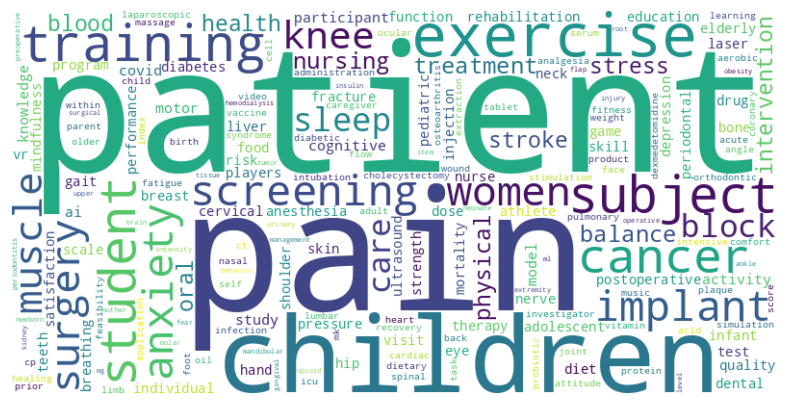

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def generate_wordcloud(df_column):
    all_words = ' '.join([' '.join(words) for words in df_column])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_words)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

generate_wordcloud(df_selected_columns['Top_10_words'])


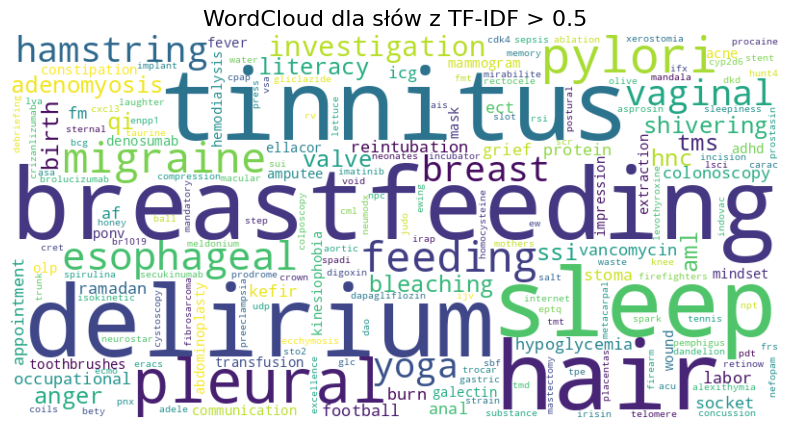

In [ ]:
# Word Cloud for TF-IDF > 0.5
def generate_wordcloud_high_tfidf(tfidf_matrix, feature_names, threshold=0.5):
    high_tfidf_words = []

    for row in tfidf_matrix.toarray():
        high_tfidf_words.extend(
            [feature_names[i] for i, value in enumerate(row) if value > threshold]
        )

    all_words = ' '.join(high_tfidf_words)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_words)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title('WordCloud dla słów z TF-IDF > 0.5', fontsize=16)
    plt.show()

generate_wordcloud_high_tfidf(tfidf_matrix, tfidf_vectorizer.get_feature_names_out(), threshold=0.5)

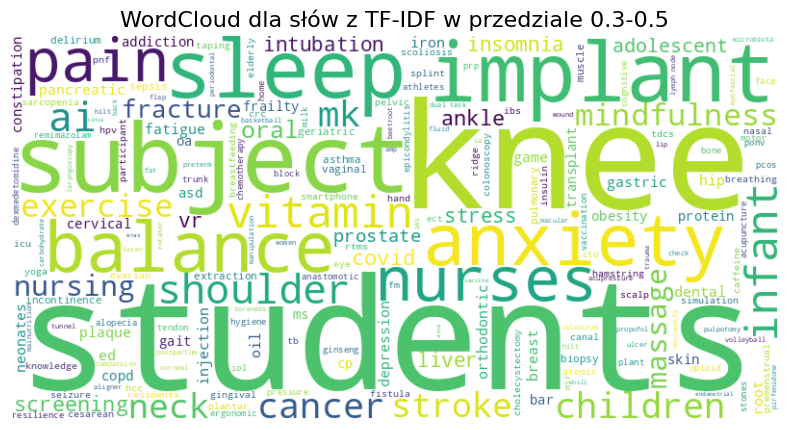

In [ ]:
# Word Cloud for words with  TF-IDF ( 0.3-0.5)
def generate_wordcloud_tfidf_range(tfidf_matrix, feature_names, min_threshold=0.3, max_threshold=0.5):
    range_tfidf_words = []

    for row in tfidf_matrix.toarray():
        range_tfidf_words.extend(
            [feature_names[i] for i, value in enumerate(row) if min_threshold <= value <= max_threshold]
        )

    all_words = ' '.join(range_tfidf_words)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_words)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'WordCloud dla słów z TF-IDF w przedziale {min_threshold}-{max_threshold}', fontsize=16)
    plt.show()

generate_wordcloud_tfidf_range(tfidf_matrix, tfidf_vectorizer.get_feature_names_out(), min_threshold=0.3, max_threshold=0.5)


## TF IDF for selected countries

Let's try to do TF IDF for countries with hihgest number of clinical trials: **Turkey** and **China**.

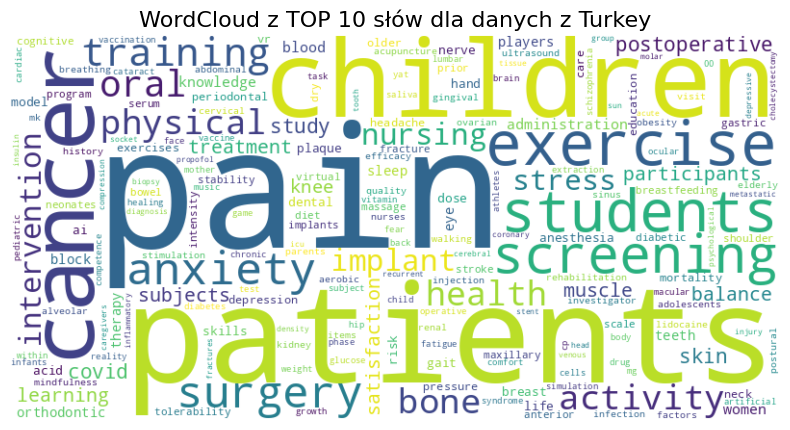

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Filter rows where `contactsLocationsModule.locations_0_country` is 'turkey'
turkey_data = df_selected_columns[df_selected_columns['contactsLocationsModule.locations_0_country'] == 'turkey']

# Combine all text columns into a single column for the filtered data
filtered_docs = turkey_data.apply(
    lambda row: ' '.join(row.dropna().astype(str)), axis=1
)

# Create a TfidfVectorizer object
tfidf_vectorizer = TfidfVectorizer()

# Fit and transform the filtered documents
tfidf_matrix = tfidf_vectorizer.fit_transform(filtered_docs)

# Get feature names (words)
feature_names = tfidf_vectorizer.get_feature_names_out()

# Function to determine the TOP 10 words for each row
def get_top_words(row, feature_names, top_n=10):
    sorted_indices = row.argsort()[::-1][:top_n]  # Indices of top N words
    return [feature_names[i] for i in sorted_indices]

# Add the `Top_10_words` column to the filtered data
turkey_data = turkey_data.copy()  # Create a copy for safety
turkey_data['Top_10_words'] = [
    get_top_words(row, feature_names, top_n=10) for row in tfidf_matrix.toarray()
]

# Sum all words from the `Top_10_words` column
from collections import Counter

# Count occurrences of words in the TOP 10 for all rows
top_words_counter = Counter(
    word for top_words in turkey_data['Top_10_words'] for word in top_words
)

# Create a word cloud from these words
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_words_counter)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('WordCloud of TOP 10 words for data from Turkey', fontsize=16)
plt.show()



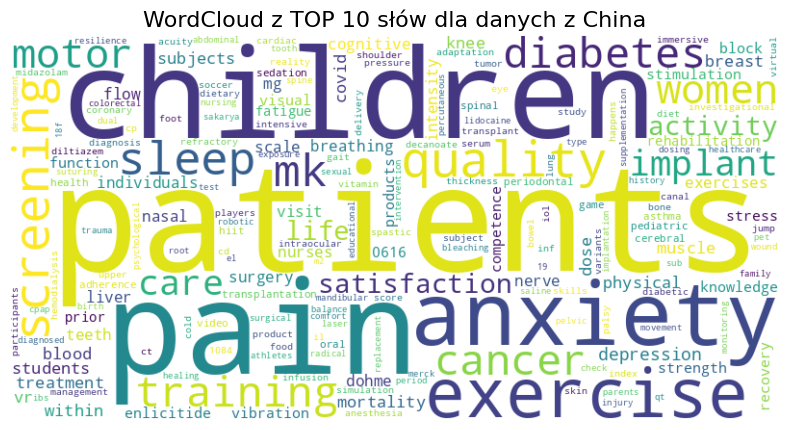

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

# Filter rows where `contactsLocationsModule.locations_0_country` is 'china'
china_data = df_selected_columns[df_selected_columns['contactsLocationsModule.locations_0_country'] == 'china']

# Combine all text columns into a single column for the filtered data
filtered_docs = china_data.apply(
    lambda row: ' '.join(row.dropna().astype(str)), axis=1
)

# Create a TfidfVectorizer object
tfidf_vectorizer = TfidfVectorizer()

# Fit and transform the filtered documents
tfidf_matrix = tfidf_vectorizer.fit_transform(filtered_docs)

# Get feature names (words)
feature_names = tfidf_vectorizer.get_feature_names_out()

# Function to determine the TOP 10 words for each row
def get_top_words(row, feature_names, top_n=10):
    sorted_indices = row.argsort()[::-1][:top_n]  # Indices of top N words
    return [feature_names[i] for i in sorted_indices]

# Add the `Top_10_words` column to the filtered data
china_data = china_data.copy()  # Create a copy for safety
china_data['Top_10_words'] = [
    get_top_words(row, feature_names, top_n=10) for row in tfidf_matrix.toarray()
]

# Sum all words from the `Top_10_words` column
# Count occurrences of words in the TOP 10 for all rows
top_words_counter = Counter(
    word for top_words in china_data['Top_10_words'] for word in top_words
)

# Create a word cloud from these words
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_words_counter)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('WordCloud of TOP 10 words for data from China', fontsize=16)
plt.show()


At first glance there is not specific difference between those two countries, I did Word Clouds for those two countries, because the most of clinical trials were connected with those two.

##correlation analysis
in this part I will test if there is correlation between TOP 20 words

In [ ]:
tfidf_df.head()

,00,000,0001,00012,0002,000iu,001,00107,001234,00130,00135,00152820385,002,00299,003,003287,003382,00344191,00352,004,0044634,00471,004adfef025ki,005,00511,0056,006,007,008,009,00am,00d,00ds,00mm,00pm,01,010,0100,0103,010973,011,0114,012,0125,013,014,015,0158,016,017,018,019,0194,01mg,02,020,022,0220,0222,023,0239,024,02409,025,026,027,02764,028,02flo,03,030,03056,031,03102023,032,032151,03219,0322,033,03308,033g,03430423,036,03893,0393,0394,03b,03m,03mg,03rd,03xheight,04,042,043,044,046,047,0476,048,0482,04943,05,050,055,058,05fk140,05ldg008b,05mci,05mg,05ml,05th,06,060,0600,0616,062,06264006,06487800,065,066,06713,068,06863135,06mg,06th,07,07054,072,07293893,073,07338233,075,07612577,0769,08,08003,082,08222,08381,0847,08532,086,087,08p1707f0,09,092,09317,0951,096,098,09th,0c,0cm,0d,0d219167,0e10,0f,0g,0h,0hour,0hrs,0kg,0m,0mg,0ml,0mm,0nd,0ne,0ng,0oc,0t,0th,0ug,0x,0x5,0x8,0xuln,0º,10,100,1000,10000,100000,10000iu,100084,1000cs,1000g,1000genomes,1000m,1000mg,1000ng,1000xg,1000µm,1001,1002,1003,1004,1005,1006,100622,1007,1008,1009,100a,100a1,100b,100bpm,100g,100hz,100k,100kg,100m,100mcg,100mg,100ml,100mm,100mmhg,100ms,100mw,100x109,100μg,101,1010,1011,1012,1013,1014,101480,1015,1015550,1016,1017,101745,1018,1019,102,1020,1021,1021189,1022,1023,1024,1025,1026,1027,1028,1029,103,1030,1031,10313,1032,1033,10330,1034,1035,1036,1037,1038,10382,1039,103a,104,1040,10401,1041,1042,1043,1044,1045,1046,1047,1048,1049,105,1050,1051,1052,1053,1054,1055,1056,1057,1058,1059,105mmhg,106,1060,1061,1062,1063,1064,1065,1066,1067,1068,1069,107,1070,1071,1072,1073,1074,1075,1076,1077,1078,1079,108,1080,1080p,1081,1082,1083,1084,1085,1086,1087,1088,1089,109,1090,1091,1092,1093,1094,1095,1096,1097,1098,1099,10b,10cc,10cigarettes,10cm,10cmh2o,10days,10f,10fr,10g,10h,10hz,10indicating,10iu,10kg,10km,10ma,10mg,10min,10mins,10minutes,10ml,10mm,10ms,10mwt,10rm,10s,10st,10th,10ul,10w,10weeks,10year,10years,10¹⁰,10⁹,11,110,1100,1101,1102,1103,1104,11045,1105,1106,1107,1108,1109,110g,111,1110,1111,11111218,1112,11124,1113,11135,1114,1115,1116,111627,1117,1118,1119,11197,112,1120,1121,1122,1123,1124,11243,1125,1126,1127,112745,1128,1129,1129b372300447,113,1130,1131,1132,1133,1134,1135,1136,1137,1138,1139,114,1140,114016,1141,11417,1142,1143,1144,1145,1146,1147,1148,1149,115,1150,1151,1152,1153,1154,1155,1156,1157,1158,1159,115mm,116,1160,1161,1162,1163,1164,1165,1166,1167,1168,1169,117,1170,1171,1171a,1171b,1172,1172280,1173,11731629,1174,1175,1176,1177,11776193500,1178,1179,118,1180,1181,1182,1183,1184,1185,1186,1187,1188,1189,119,1190,1191,1192,1193,1194,1195,1196,1197,1198,11981,1199,11a,11l,11ml,11mm,11mmol,11p14,11q,11s28,11th,11β,12,120,1200,12000,1200mg,1200mw,1201,1202,1203,1204,1205,1206,1207,1208,1209,120kg,120mg,120ml,120mm,120mmhg,120mtrs,120pt,120s,120th,121,1210,1211,1212,1213,1214,1215,1216,1217,1218,1219,12192,122,1220,1221,1222,1223,1224,1225,1226,12264678,1227,1228,1229,123,1230,1231,1232,1233,1234,1235,1236,1237,1238,1239,123i,124,1240,1241,1242,1243,1244,1245,1246,1247,1248,1249,124a,124mm,125,1250,1250mg,1251,1252,1253,12534,1254,1255,1256,1257,1258,1259,125mg,125mm,126,1260,1261,1262,1263,1264,1265,1266,1267,1268,1269,126mg,127,1270,1271,1272,1273,1274,1275,1276,1277,1278,12783,1279,128,1280,1281,1282,1283,1284,1285,1286,1287,1288,12885,1289,129,1290,1291,1292,1293,12938,1294,1295,1296,12968,1297,1298,12984,1299,12f,12g,12gy,12h,12hours,12l,12mg,12mm,12month,12months,12ng,12pm,12q13,12th,12week,12weeks,12x,12years,13,130,1300,1301,13015,1302,1303,1304,1305,1306,1307,1308,1309,131,1310,1311,1312,1313,1314,1315,1316,1317,1318,1319,131i,132,1320,13200,1321,13213,1322,1323,1324,1325,1326,1327,1328,1329,133,1330,1331,1332,1333,1334,1335,1336,1337,1338,1339,133mg,134,1340,13408,1341,1342,1343,1344,1345,1346,1347,1348,1349,134a,135,1350,1351,1352,1353,1354,1355,1356,1357,1358,1359,135mmol,135º,136,1360,1361,1362,1363,1364,1365,1366,1367,1368,1369,137,1370,1371,1372,1373,1374,1375,1376,1377,1378,1379,138,1380,1381,1382,13823093,1383,1384,1385,1

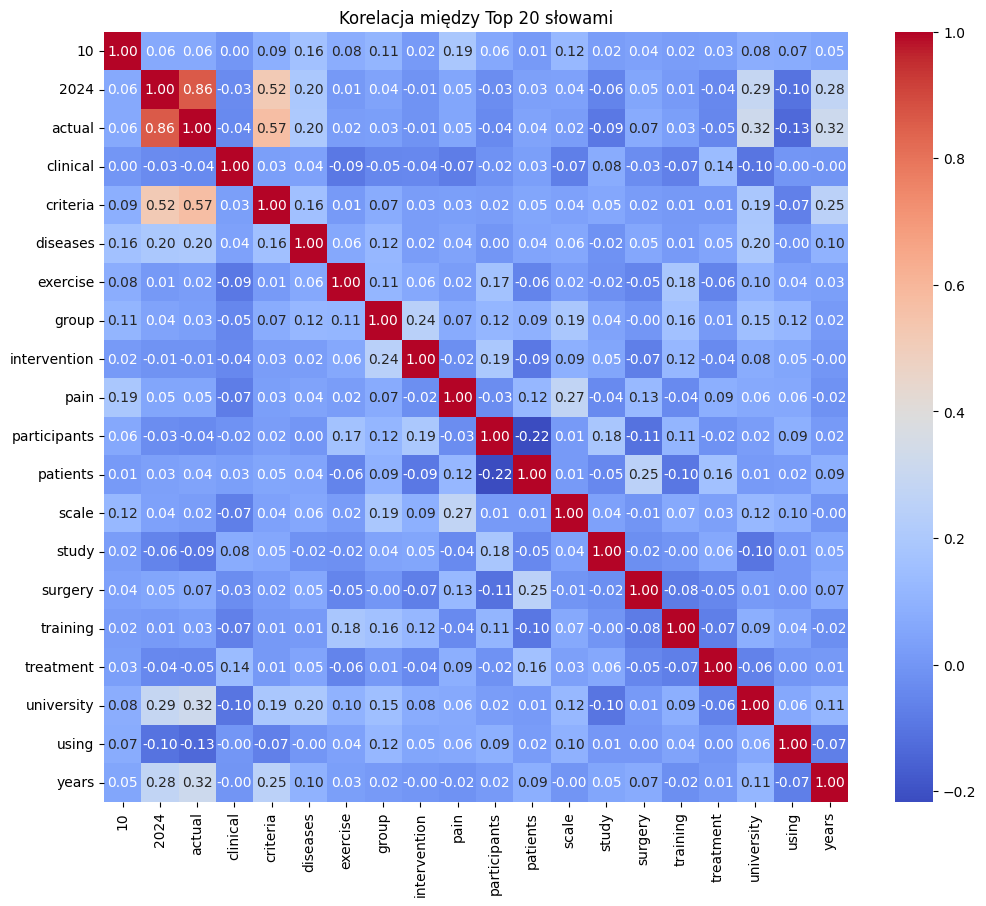

In [ ]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Calculating correlation between words
def analyze_word_correlation(tfidf_df, feature_names, top_n=20):
    # Select only the top N words based on the sum of TF-IDF scores
    overall_scores = tfidf_df.sum(axis=0)

    # Match to feature names - find indices in the `feature_names` array
    top_indices = overall_scores.nlargest(top_n).index.tolist()

    # Create a list of labels for the plot
    top_features = [feature for feature in feature_names if feature in top_indices]

    # Select the relevant columns from the DataFrame
    top_words_df = tfidf_df[top_features]

    # Compute the correlation matrix (Pearson correlation)
    correlation_matrix = top_words_df.corr()

    # Visualize the correlation heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(
        correlation_matrix,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        xticklabels=top_features,
        yticklabels=top_features
    )
    plt.title(f"Correlation between Top {top_n} words")
    plt.show()

# Call the correlation analysis function
analyze_word_correlation(tfidf_df, tfidf_vectorizer.get_feature_names_out(), top_n=20)


As a result, we do not see any significant correlations—most of the values in the correlation matrix are close to 0, which is typical when there are no relationships between words

## TF IDF for rare medical names
Let's try find some rare medical names in analyzed text by using TF-IDF:

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

# Function for detecting rare terms
def detect_rare_terms(df, min_df=0.01):
    # Tokenize text
    tfidf_vectorizer = TfidfVectorizer(stop_words='english', min_df=min_df)  # min_df specifies the minimum number of documents that must contain a word for it to be included
    tfidf_matrix = tfidf_vectorizer.fit_transform(df.astype(str).values.flatten())  # Convert all values to strings before processing

    # Create a DataFrame with TF-IDF results
    tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

    return tfidf_df

# Apply the function to the entire DataFrame
rare_terms_df = detect_rare_terms(df_selected_columns)

# Display the top rare terms
rare_terms = rare_terms_df.sum(axis=0).sort_values(ascending=False)
print(rare_terms)

2024                      9809.658954
diseases                  8497.332882
actual                    7986.140395
university                6610.369752
patients                  4799.345524
study                     4320.207658
group                     4236.800463
false                     4011.833684
years                     3717.489290
principal_investigator    3517.000000
experimental              3153.885914
hospital                  2919.898328
interventional            2724.308882
pain                      2672.254054
10                        2604.430683
disorders                 2427.940628
18                        2390.622155
treatment                 2367.167681
criteria                  2147.551625
symptoms                  1909.495638
participants              1861.513966
intervention              1846.824864
using                     1834.309883
months                    1786.667587
12                        1728.736635
weeks                     1665.342498
surgery     

Above approach does not provide specific medical names - it is just statistical calculation for word occuring in the text. It rather helps identify less frequent words that might carry important contextual meaning.  

## most important words in every document (clinical trials)
In below I will be looking for Top 5 words in every clinical trial:

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
from wordcloud import WordCloud

tfidf_vectorizer = TfidfVectorizer()

tfidf_matrix = tfidf_vectorizer.fit_transform(docs_selected.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1))

# Converting tf-idf matrix on df
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())

# Displaying most important words for every document
for index, row in tfidf_df.iterrows():
    print(f"Najważniejsze słowa dla dokumentu {index + 1} (ID: {ids_selected.iloc[index]}):")
    # sorting
    sorted_row = row.sort_values(ascending=False)
    top_words = sorted_row.head(5)  # selecting top5
    print(top_words)
    print("\n")






Streaming output truncated to the last 5000 lines.
dexmedetomidine    0.221071
sinus              0.217756
Name: 3444, dtype: float64


Najważniejsze słowa dla dokumentu 3446 (ID: nct06437691):
stent         0.392935
colorectal    0.287082
emergency     0.246150
placement     0.189581
underwent     0.187147
Name: 3445, dtype: float64


Najważniejsze słowa dla dokumentu 3447 (ID: nct06437639):
poag             0.377325
mexidol          0.272143
mitochondrial    0.260131
mitochondria     0.206093
pharmasoft       0.206093
Name: 3446, dtype: float64


Najważniejsze słowa dla dokumentu 3448 (ID: nct06437626):
stroke         0.356044
mexidol        0.255088
rankin         0.188242
mrs            0.179604
hemorrhagic    0.161528
Name: 3447, dtype: float64


Najważniejsze słowa dla dokumentu 3449 (ID: nct06437561):
aneurysms      0.662649
venous         0.496926
superficial    0.185139
aneurysm       0.183424
limbs          0.114350
Name: 3448, dtype: float64


Najważniejsze słowa dla dokumen

In [ ]:
# calculating average tf-idf for every document
doc_tfidf_mean = tfidf_df.mean(axis=1)

# selecting top5 doscuments
top_docs = doc_tfidf_mean.nlargest(5)

print("Najbardziej reprezentatywne dokumenty:")
for idx in top_docs.index:
    print(f"ID: {ids_selected.iloc[idx]}, Średnia TF-IDF: {top_docs[idx]}")
    print(df_selected_columns.iloc[idx]['identificationModule.briefTitle'])
    print("\n")


Najbardziej reprezentatywne dokumenty:
ID: nct06694844, Średnia TF-IDF: 0.0003997812775609861
microbiome analysis dental biofilm high density polytetrafluoroethylene membranes used socket preservation


ID: nct06684288, Średnia TF-IDF: 0.0003712994547734451
efficacy access flap surgery subgingival peridontopatgogens individuals periodontitis


ID: nct06548503, Średnia TF-IDF: 0.0003692797231386705
sylimarin pyrroloquinoline quinone sodium salt myricetin assumption effects


ID: nct06733103, Średnia TF-IDF: 0.0003657618898865002
pilot cognitive stimulation therapy pre frail stroke survivors


ID: nct06663488, Średnia TF-IDF: 0.00035993075081946563
thoracic spinal versus thoracic epidural anesthesia patients chronic obstructive pulmonary disease undergoing supine percutaneous nephrolithotomy management renal stones




## cosine similarity

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import numpy as np

# calculating matrix of cosine similarity
cosine_sim_matrix = cosine_similarity(tfidf_matrix)

# Calculating similarities only for top10
def get_top_cosine_similarities(matrix, ids, top_n=10):
    similarities = []
    for i in range(len(matrix)):
        for j in range(i + 1, len(matrix)):  # Górna trójkąt macierzy
            similarities.append((ids[i], ids[j], matrix[i, j]))
    # Sorting values
    sorted_similarities = sorted(similarities, key=lambda x: x[2], reverse=True)
    return sorted_similarities[:top_n]

# Top 10 cosin similarities
top_similarities = get_top_cosine_similarities(cosine_sim_matrix, ids_selected, top_n=10)

# Displaying Top10
print("\nTOP 10 najwyższych podobieństw kosinusowych:")
for doc1, doc2, similarity in top_similarities:
    print(f"Dokument {doc1} i Dokument {doc2}: Podobieństwo = {similarity:.4f}")





TOP 10 najwyższych podobieństw kosinusowych:
Dokument nct06399068 i Dokument nct06399055: Podobieństwo = 0.9819
Dokument nct06502470 i Dokument nct06421207: Podobieństwo = 0.9204
Dokument nct06415799 i Dokument nct06415786: Podobieństwo = 0.9082
Dokument nct06517485 i Dokument nct06517433: Podobieństwo = 0.9053
Dokument nct06687499 i Dokument nct06687473: Podobieństwo = 0.9030
Dokument nct06589921 i Dokument nct06588517: Podobieństwo = 0.8982
Dokument nct06565884 i Dokument nct06441799: Podobieństwo = 0.8904
Dokument nct06558058 i Dokument nct06558045: Podobieństwo = 0.8898
Dokument nct06553937 i Dokument nct06553924: Podobieństwo = 0.8846
Dokument nct06607393 i Dokument nct06585189: Podobieństwo = 0.8834


## clustering based on TF-IDF

In [ ]:
from sklearn.cluster import KMeans

# Number of clusters to be selected in "elbow method"
num_clusters = 9

# KMeans clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
labels = kmeans.fit_predict(tfidf_matrix)

# Adding label's clusters to df
df_selected_columns['Cluster'] = labels


NameError: name 'tfidf_matrix' is not defined

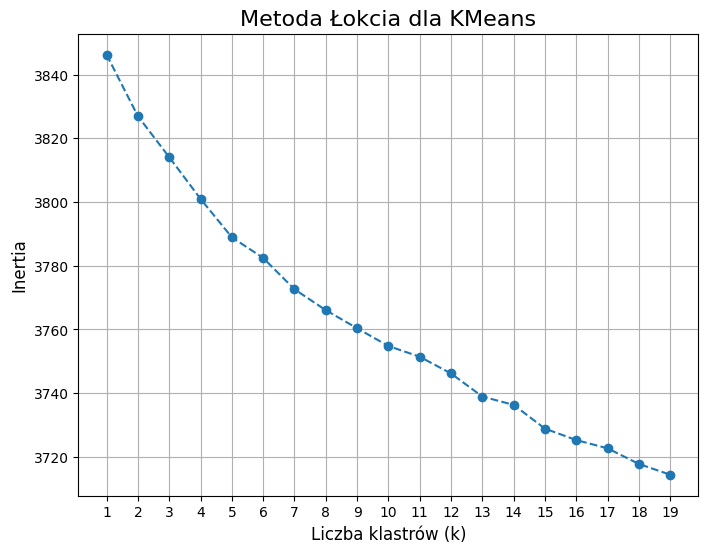

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Clusters range for testing in elbow methods
k_values = range(1, 20)
inertia_values = []

# Calculating "inertia" for different clusters
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(tfidf_matrix)
    inertia_values.append(kmeans.inertia_)

# Plotting results
plt.figure(figsize=(8, 6))
plt.plot(k_values, inertia_values, marker='o', linestyle='--')
plt.title('Metoda Łokcia dla KMeans', fontsize=16)
plt.xlabel('Liczba klastrów (k)', fontsize=12)
plt.ylabel('Inertia', fontsize=12)
plt.xticks(k_values)
plt.grid(True)
plt.show()


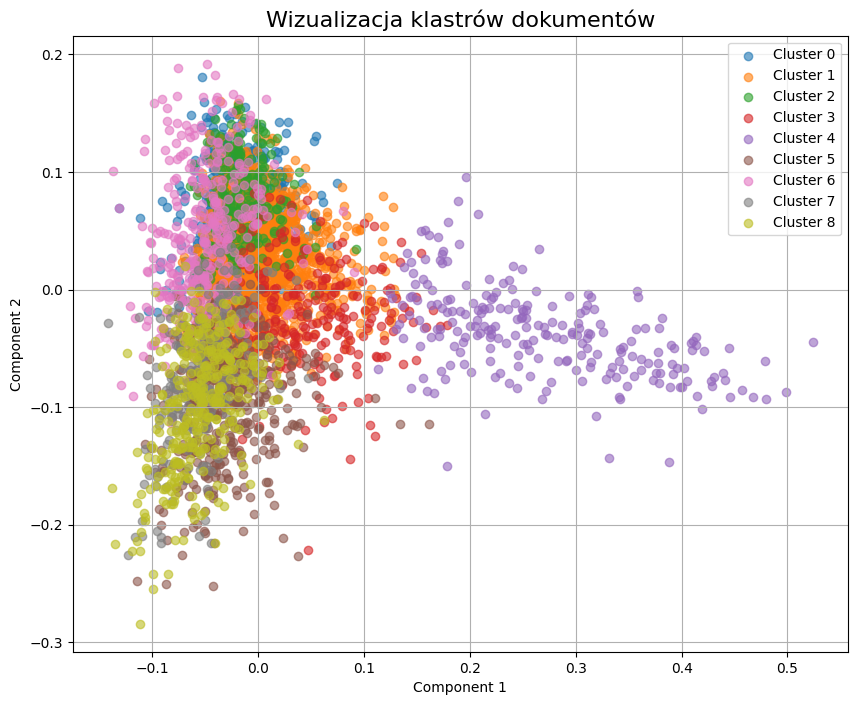

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# PCA dimension reduction
pca = PCA(n_components=2, random_state=42)
reduced_data = pca.fit_transform(tfidf_matrix.toarray())

# DataFrames after PCA reduction
reduced_df = pd.DataFrame(reduced_data, columns=["Component 1", "Component 2"])
reduced_df['Cluster'] = labels

num_clusters_2 = 9 # ! selecting 9 clusters

plt.figure(figsize=(10, 8))
for cluster in range(num_clusters_2):
    cluster_data = reduced_df[reduced_df['Cluster'] == cluster]
    plt.scatter(
        cluster_data['Component 1'],
        cluster_data['Component 2'],
        label=f"Cluster {cluster}",
        alpha=0.6
    )


plt.title("Wizualizacja klastrów dokumentów", fontsize=16)
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.legend()
plt.grid(True)
plt.show()


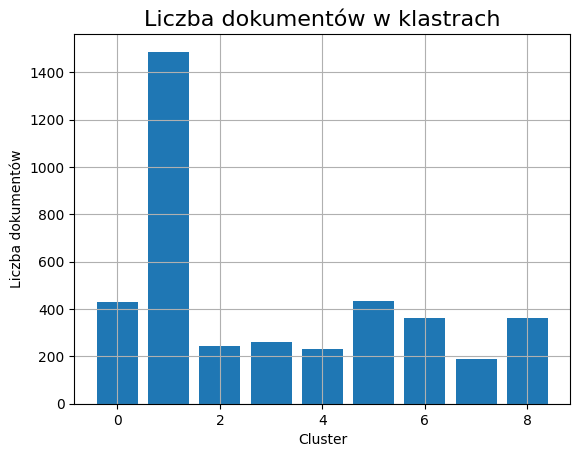

In [ ]:
import matplotlib.pyplot as plt

cluster_counts = df_selected_columns['Cluster'].value_counts()
plt.bar(cluster_counts.index, cluster_counts.values)
plt.title("Liczba dokumentów w klastrach", fontsize=16)
plt.xlabel("Cluster")
plt.ylabel("Liczba dokumentów")
plt.grid(True)
plt.show()


In [ ]:
# Checking documents in clusters:
cluster_4_data = df_selected_columns[df_selected_columns['Cluster'] == 4]
print("Dane w klastrze 4:")
print(cluster_4_data[['conditionBrowseModule.browseBranches_0_name', 'Cluster']])
print("\n")

Dane w klastrze 4:
           conditionBrowseModule.browseBranches_0_name  Cluster
34                                           neoplasms        4
88                                          infections        4
92                          behaviors mental disorders        4
138                         symptoms general pathology        4
143   urinary tract sexual organs pregnancy conditions        4
155                            nervous system diseases        4
196                         symptoms general pathology        4
199                         behaviors mental disorders        4
241                                          neoplasms        4
257                         symptoms general pathology        4
258                               heart blood diseases        4
321   urinary tract sexual organs pregnancy conditions        4
350                                          neoplasms        4
365                                          neoplasms        4
392                  

## top features for every cluster

In [ ]:
import numpy as np

# Centroidy klastrów
centroids = kmeans.cluster_centers_

# Extracting feature names
feature_names = tfidf_vectorizer.get_feature_names_out()

# Analysis of most importatn features in every cluster
for cluster_idx in range(num_clusters):
    print(f"Najważniejsze cechy dla klastra {cluster_idx}:")
    # Pobieramy indeksy cech o największych wartościach dla danego klastra
    top_feature_indices = centroids[cluster_idx].argsort()[-10:][::-1]
    top_features = [feature_names[i] for i in top_feature_indices]
    top_values = centroids[cluster_idx][top_feature_indices]

    for feature, value in zip(top_features, top_values):
        print(f"{feature}: {value:.4f}")
    print("\n")


Najważniejsze cechy dla klastra 0:
students: 0.1681
nursing: 0.1154
knowledge: 0.0580
training: 0.0575
education: 0.0570
nurses: 0.0556
skills: 0.0463
group: 0.0394
study: 0.0394
care: 0.0371


Najważniejsze cechy dla klastra 1:
women: 0.0945
birth: 0.0490
maternal: 0.0349
pregnant: 0.0345
pregnancy: 0.0332
study: 0.0318
breastfeeding: 0.0310
group: 0.0293
labor: 0.0285
postpartum: 0.0268


Najważniejsze cechy dla klastra 2:
implant: 0.2012
bone: 0.1133
implants: 0.0966
patients: 0.0531
placement: 0.0496
mandibular: 0.0475
ridge: 0.0459
peri: 0.0451
alveolar: 0.0397
dental: 0.0387


Najważniejsze cechy dla klastra 3:
oral: 0.1869
health: 0.0504
hygiene: 0.0448
care: 0.0408
patients: 0.0385
pylori: 0.0360
dental: 0.0357
mucositis: 0.0356
study: 0.0351
group: 0.0328


Najważniejsze cechy dla klastra 4:
study: 0.0416
treatment: 0.0384
subjects: 0.0323
patients: 0.0309
skin: 0.0292
participants: 0.0224
diseases: 0.0222
clinical: 0.0222
2024: 0.0213
blood: 0.0204


Najważniejsze cechy dla k

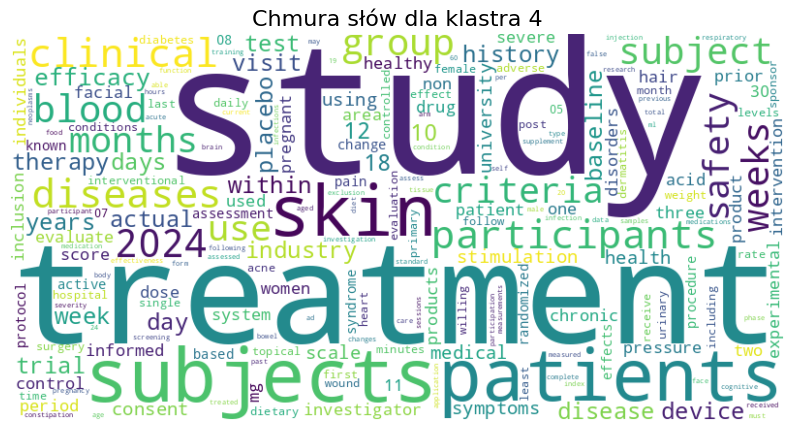

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

cluster_idx = 4
word_weights = {feature_names[i]: centroids[cluster_idx][i] for i in range(len(feature_names))}

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_weights)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title(f"Chmura słów dla klastra {cluster_idx}", fontsize=16)
plt.show()


testing random forest classifier:

In [ ]:
from sklearn.ensemble import RandomForestClassifier

X = tfidf_matrix.toarray()
y = labels  # claster labels

rf = RandomForestClassifier(random_state=42)
rf.fit(X, y)

# Feature importance
feature_importances = rf.feature_importances_
top_feature_indices = np.argsort(feature_importances)[-10:][::-1]
top_features = [feature_names[i] for i in top_feature_indices]
top_importances = feature_importances[top_feature_indices]

# Printing results
print("Najważniejsze cechy wg Random Forest:")
for feature, importance in zip(top_features, top_importances):
    print(f"{feature}: {importance:.4f}")


Najważniejsze cechy wg Random Forest:
pain: 0.0095
children: 0.0064
training: 0.0038
exercise: 0.0036
patients: 0.0036
interventional: 0.0035
physical: 0.0035
surgery: 0.0033
program: 0.0028
anesthesia: 0.0028


# **clustering based on TF-IDF (data splited on train and test)**

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

# Assuming `df_selected_columns` is a DataFrame with the column 'identificationModule.briefTitle'
ids_selected = df_selected_columns['identificationModule.nctId']
docs_selected = df_selected_columns.drop(columns=['identificationModule.nctId'])

# Combining row values into a single text string for each column
docs_selected_combined = docs_selected.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1)

# Splitting the data into training and test sets
X_train, X_test, ids_train, ids_test = train_test_split(
    docs_selected_combined, ids_selected, test_size=0.2, random_state=42
)

# Creating a TfidfVectorizer object
tfidf_vectorizer = TfidfVectorizer()

# Fitting and transforming the training data into TF-IDF values
tfidf_train_matrix = tfidf_vectorizer.fit_transform(X_train)

# Transforming the test data using the fitted TF-IDF model
tfidf_test_matrix = tfidf_vectorizer.transform(X_test)

# Converting the resulting matrix into a DataFrame for easier analysis
tfidf_train_df = pd.DataFrame(
    tfidf_train_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out()
)
tfidf_test_df = pd.DataFrame(
    tfidf_test_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out()
)

# Creating a function to identify the Top 10 words in a row
def get_top_words(row, feature_names, top_n=10):
    sorted_indices = row.argsort()[::-1][:top_n]  # Indices of the top N words
    return [feature_names[i] for i in sorted_indices]

# Creating a Top_10_words column in both the training and test sets
df_train_top_words = pd.DataFrame({
    'Top_10_words': [
        get_top_words(row, tfidf_vectorizer.get_feature_names_out(), top_n=10)
        for row in tfidf_train_matrix.toarray()
    ],
    'nctId': ids_train.values
})

df_test_top_words = pd.DataFrame({
    'Top_10_words': [
        get_top_words(row, tfidf_vectorizer.get_feature_names_out(), top_n=10)
        for row in tfidf_test_matrix.toarray()
    ],
    'nctId': ids_test.values
})

# Results
print("Train DataFrame with Top 10 Words:\n", df_train_top_words.head())
print("Test DataFrame with Top 10 Words:\n", df_test_top_words.head())


Train DataFrame with Top 10 Words:
                                         Top_10_words        nctId
0  [butyrate, steatosis, liver, nafld, gluconate,...  nct06398522
1  [implant, segmentation, ai, planning, aldo, mo...  nct06693635
2  [massage, depression, postpartum, postnatal, i...  nct06475885
3  [treatment, wrinkle, nebulyft, subjects, discr...  nct06623214
4  [balance, visually, individuals, coordination,...  nct06687915
Test DataFrame with Top 10 Words:
                                         Top_10_words        nctId
0  [ipack, block, sciatic, popliteal, knee, adduc...  nct06683313
1  [swsm, gay, stigma, kong, hong, nursing, minor...  nct06434805
2  [weight, motivational, body, mi, interviewing,...  nct06685432
3  [cardiac, physiotherapy, intensive, unit, stay...  nct06402903
4  [gaps, occupational, stroke, mild, oct, heidel...  nct06476262


Silhouette Score dla danych treningowych: 0.00
Rozkład klastrów w danych treningowych: [  78  801  392 1065  400   56  165  111  132]
Rozkład klastrów w danych testowych: [ 16 205 105 290 101  12  24  18  29]


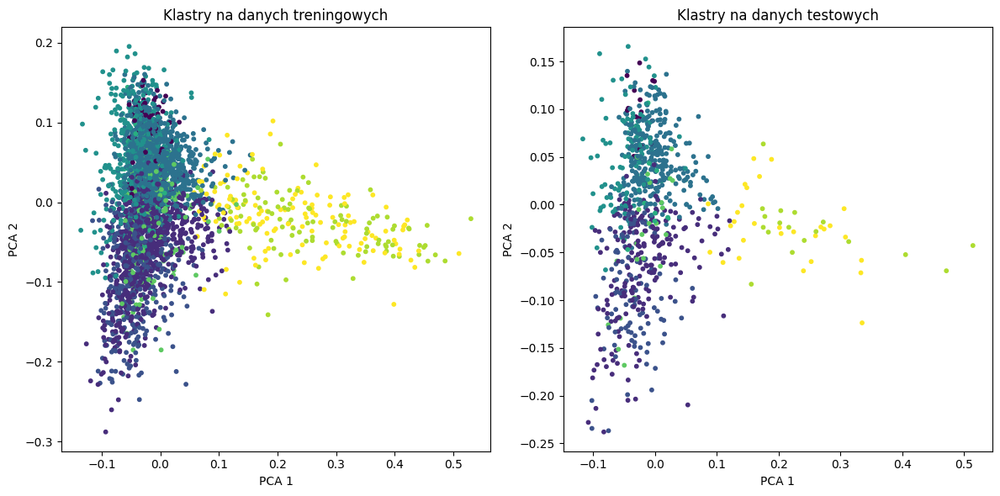

Top 10 słów dla każdego klastra (trening):
Cluster 0: implant, bone, implants, patients, mandibular, ridge, alveolar, placement, peri, dental
Cluster 1: study, intervention, students, group, children, health, participants, 2024, scale, diseases
Cluster 2: exercise, training, muscle, balance, physical, strength, exercises, group, test, motor
Cluster 3: patients, study, surgery, treatment, 2024, diseases, hospital, group, cancer, criteria
Cluster 4: pain, patients, block, scale, group, treatment, surgery, study, postoperative, diseases
Cluster 5: intubation, neonates, infants, preterm, airway, laryngoscopy, difficult, patients, neonatal, endotracheal
Cluster 6: women, birth, pregnant, vaginal, pregnancy, breastfeeding, maternal, study, scale, group
Cluster 7: subjects, subject, study, within, screening, prior, history, investigator, drug, dose
Cluster 8: screening, study, healthy, history, dose, within, drug, industry, mk, prior


In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# 1. Clustering on training data
n_clusters = 9  # Number of clusters (to be adjusted based on the data)
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(tfidf_train_matrix)

# Assigning clusters to training data
train_clusters = kmeans.predict(tfidf_train_matrix)
df_train_top_words['Cluster'] = train_clusters

# Evaluating cluster quality on training data
silhouette_train = silhouette_score(tfidf_train_matrix, train_clusters)
print(f"Silhouette Score for training data: {silhouette_train:.2f}")

# 2. Predicting clusters on test data
test_clusters = kmeans.predict(tfidf_test_matrix)
df_test_top_words['Cluster'] = test_clusters

# 3. Evaluating cluster quality on test data
# Checking cluster distribution
train_cluster_counts = np.bincount(train_clusters)
test_cluster_counts = np.bincount(test_clusters, minlength=n_clusters)

print("Cluster distribution in training data:", train_cluster_counts)
print("Cluster distribution in test data:", test_cluster_counts)

# 4. Cluster visualization (optional)
# Dimensionality reduction using PCA
pca = PCA(n_components=2, random_state=42)
train_pca = pca.fit_transform(tfidf_train_matrix.toarray())
test_pca = pca.transform(tfidf_test_matrix.toarray())

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(train_pca[:, 0], train_pca[:, 1], c=train_clusters, cmap='viridis', s=10)
plt.title("Clusters in Training Data")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")

plt.subplot(1, 2, 2)
plt.scatter(test_pca[:, 0], test_pca[:, 1], c=test_clusters, cmap='viridis', s=10)
plt.title("Clusters in Test Data")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")

plt.tight_layout()
plt.show()

# 5. Cluster Interpretation
# Displaying the Top 10 words in each cluster for training data
cluster_top_words = {}
for cluster_id in range(n_clusters):
    cluster_indices = np.where(train_clusters == cluster_id)[0]
    cluster_data = tfidf_train_matrix[cluster_indices].mean(axis=0).A1
    top_indices = cluster_data.argsort()[::-1][:10]
    cluster_top_words[cluster_id] = [tfidf_vectorizer.get_feature_names_out()[i] for i in top_indices]

print("Top 10 words for each cluster (training):")
for cluster_id, words in cluster_top_words.items():
    print(f"Cluster {cluster_id}: {', '.join(words)}")


in below code I am going to prepare csv files for streamlit app

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# Assigning clusters to training and test data
df_train_top_words["Cluster"] = train_clusters
df_test_top_words["Cluster"] = test_clusters

# Adding PCA1 and PCA2 columns
df_train_top_words["PCA1"] = train_pca[:, 0]
df_train_top_words["PCA2"] = train_pca[:, 1]
df_test_top_words["PCA1"] = test_pca[:, 0]
df_test_top_words["PCA2"] = test_pca[:, 1]

# Merging words into a single column for WordCloud visualization
df_train_top_words["Combined_Text"] = [
    " ".join(words) for words in df_train_top_words["Top_10_words"]
]
df_test_top_words["Combined_Text"] = [
    " ".join(words) for words in df_test_top_words["Top_10_words"]
]

# Adding a column with "Top_10_words" as a comma-separated text string
df_train_top_words["Top_10_words_text"] = df_train_top_words["Top_10_words"].apply(lambda x: ", ".join(x))
df_test_top_words["Top_10_words_text"] = df_test_top_words["Top_10_words"].apply(lambda x: ", ".join(x))

# Exporting training data to a CSV file
df_train_top_words[["nctId", "Cluster", "PCA1", "PCA2", "Combined_Text", "Top_10_words_text"]].to_csv(
    "train_clusters_with_pca.csv", index=False
)

# Exporting test data to a CSV file
df_test_top_words[["nctId", "Cluster", "PCA1", "PCA2", "Combined_Text", "Top_10_words_text"]].to_csv(
    "test_clusters_with_pca.csv", index=False
)

print("Data has been exported to 'train_clusters_with_pca.csv' and 'test_clusters_with_pca.csv'.")


Dane zostały wyeksportowane do plików 'train_clusters_with_pca.csv' i 'test_clusters_with_pca.csv'.


## Kullback-Leibler divergence

Kullback-Leibler divergence między rozkładami treningowym a testowym: 0.0104


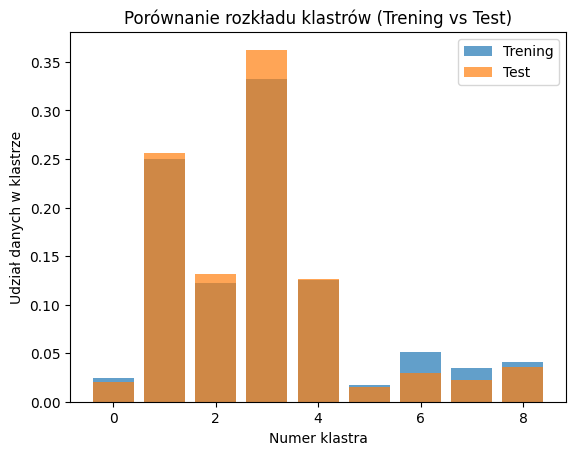

In [ ]:
from scipy.stats import entropy

train_distribution = np.bincount(train_clusters, minlength=n_clusters) / len(train_clusters)
test_distribution = np.bincount(test_clusters, minlength=n_clusters) / len(test_clusters)

kl_divergence = entropy(test_distribution, train_distribution)
print(f"Kullback-Leibler divergence między rozkładami treningowym a testowym: {kl_divergence:.4f}")

plt.bar(range(n_clusters), train_distribution, alpha=0.7, label="Trening")
plt.bar(range(n_clusters), test_distribution, alpha=0.7, label="Test")
plt.xlabel("Numer klastra")
plt.ylabel("Udział danych w klastrze")
plt.title("Porównanie rozkładu klastrów (Trening vs Test)")
plt.legend()
plt.show()


# RandomForestClassifier after TF IDF

In [ ]:
# Fitting and transforming training data (training sets define the features)
tfidf_vectorizer = TfidfVectorizer()
tfidf_train_matrix = tfidf_vectorizer.fit_transform(X_train)

# Transforming test data using the fitted TF-IDF model
tfidf_test_matrix = tfidf_vectorizer.transform(X_test)

In [ ]:
from sklearn.cluster import KMeans

# cluster numbers
n_clusters = 8

# clustering on training data
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(tfidf_train_matrix)


KMeans(random_state=42)

In [ ]:
# Assigning clusters to predicted data
train_clusters = kmeans.predict(tfidf_train_matrix)

# Assigning clusters to testing data
test_clusters = kmeans.predict(tfidf_test_matrix)


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Training Random Forest on training data (TF-IDF + assigned clusters as labels)
rfc = RandomForestClassifier(random_state=42)
rfc.fit(tfidf_train_matrix, train_clusters)

# Prediction on test data
predicted_clusters = rfc.predict(tfidf_test_matrix)

# Evaluation of results
print("Random Forest model accuracy on test data:")
print(f"Accuracy: {accuracy_score(test_clusters, predicted_clusters):.2f}")

print("\nClassification report:")
print(classification_report(test_clusters, predicted_clusters))


Dokładność modelu Random Forest na danych testowych:
Accuracy: 0.71

Raport klasyfikacji:
              precision    recall  f1-score   support

           0       1.00      0.18      0.30        17
           1       0.68      0.76      0.72       203
           2       0.94      0.49      0.64       105
           3       0.66      0.95      0.78       313
           4       1.00      0.33      0.50        87
           5       0.00      0.00      0.00        12
           6       1.00      0.12      0.22        24
           7       0.97      0.82      0.89        39

    accuracy                           0.71       800
   macro avg       0.78      0.46      0.51       800
weighted avg       0.76      0.71      0.68       800



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import numpy as np

# SMOTE: Balancing classes in the training data
smote = SMOTE(random_state=42)
X_train_balanced, train_clusters_balanced = smote.fit_resample(tfidf_train_matrix, train_clusters)

# Checking class distribution after applying SMOTE
unique, counts = np.unique(train_clusters_balanced, return_counts=True)
print("Class distribution after applying SMOTE:", dict(zip(unique, counts)))

# Training Random Forest on balanced data
rfc_smote = RandomForestClassifier(random_state=42)
rfc_smote.fit(X_train_balanced, train_clusters_balanced)

# Prediction on test data
predicted_clusters_smote = rfc_smote.predict(tfidf_test_matrix)

# Evaluation of results
print("Random Forest model accuracy (after SMOTE) on test data:")
print(f"Accuracy: {accuracy_score(test_clusters, predicted_clusters_smote):.2f}")

print("\nClassification report:")
print(classification_report(test_clusters, predicted_clusters_smote))


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(


Rozkład klas po zastosowaniu SMOTE: {0: 1197, 1: 1197, 2: 1197, 3: 1197, 4: 1197, 5: 1197, 6: 1197, 7: 1197}
Dokładność modelu Random Forest (po SMOTE) na danych testowych:
Accuracy: 0.80

Raport klasyfikacji:
              precision    recall  f1-score   support

           0       0.94      0.94      0.94        17
           1       0.77      0.69      0.73       203
           2       0.87      0.80      0.83       105
           3       0.76      0.91      0.83       313
           4       0.90      0.71      0.79        87
           5       1.00      0.42      0.59        12
           6       0.71      0.42      0.53        24
           7       0.88      0.92      0.90        39

    accuracy                           0.80       800
   macro avg       0.85      0.73      0.77       800
weighted avg       0.80      0.80      0.79       800



In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, accuracy_score

# Applying SMOTE on the training data
smote = SMOTE(random_state=42)
tfidf_train_smote, train_clusters_smote = smote.fit_resample(tfidf_train_matrix, train_clusters)

print(f"Class distribution after applying SMOTE: {dict(zip(*np.unique(train_clusters_smote, return_counts=True)))}")

# Initializing the Gradient Boosting model
gbc = GradientBoostingClassifier(random_state=42)

# Training the model on SMOTE-balanced data
gbc.fit(tfidf_train_smote, train_clusters_smote)

# Prediction on test data
predicted_clusters_gbc = gbc.predict(tfidf_test_matrix)

# Evaluation of results
print("Gradient Boosting model accuracy on test data:")
print(f"Accuracy: {accuracy_score(test_clusters, predicted_clusters_gbc):.2f}")

print("\nClassification report:")
print(classification_report(test_clusters, predicted_clusters_gbc))



/usr/local/lib/python3.10/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The SMOTE or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(


Rozkład klas po zastosowaniu SMOTE: {0: 1197, 1: 1197, 2: 1197, 3: 1197, 4: 1197, 5: 1197, 6: 1197, 7: 1197}
Dokładność modelu Gradient Boosting na danych testowych:
Accuracy: 0.83

Raport klasyfikacji:
              precision    recall  f1-score   support

           0       0.84      0.94      0.89        17
           1       0.76      0.75      0.76       203
           2       0.85      0.84      0.85       105
           3       0.86      0.83      0.85       313
           4       0.91      0.90      0.90        87
           5       0.62      0.83      0.71        12
           6       0.61      0.92      0.73        24
           7       0.89      0.87      0.88        39

    accuracy                           0.83       800
   macro avg       0.79      0.86      0.82       800
weighted avg       0.83      0.83      0.83       800



*  Overall Accuracy: 83%, meaning 83% of test samples were correctly classified.
*  Precision & Recall:
Most classes have good precision and recall (above 0.75), with some lower recall values (e.g., class 5: 0.62 precision, 0.83 recall).
Class 0 has very high recall (0.94), meaning most instances of class 0 were correctly identified, but it has a small support (only 17 instances).
*  Some underrepresented classes (before SMOTE) still have slightly lower precision.
*  The model generalizes well, but further fine-tuning could improve minority class performance.